In [23]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mt_img
import cv2
import os
import numpy as np


In [24]:
apple = image.load_img("Train/Apple/0_100.jpg")
orange = image.load_img("Train/Orange/0_100.jpg")

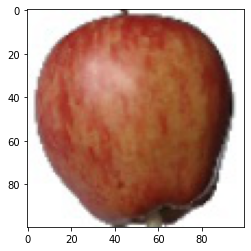

In [25]:
plt.imshow(apple)

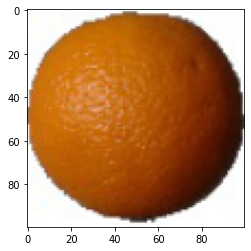

In [26]:
plt.imshow(orange)

In [27]:
imageMat = mt_img.imread("Train/Apple/0_100.jpg")
print("Current Shape: ",imageMat.shape)
imageMat_reshape = imageMat.reshape(imageMat.shape[0],-1)
print("Reshaping: ", imageMat_reshape.shape)

Current Shape:  (100, 100, 3)
Reshaping:  (100, 300)


In [28]:
train = ImageDataGenerator(rescale=1/255)
validation = ImageDataGenerator(rescale=1/255)

In [29]:
train_dataset = train.flow_from_directory("Train/", target_size=(250,250), batch_size=3, class_mode='binary')
validation_dataset = train.flow_from_directory("Validation/", target_size=(250,250), batch_size=3, class_mode='binary')


Found 971 images belonging to 2 classes.
Found 324 images belonging to 2 classes.


In [30]:
train_dataset.class_indices

{'Apple': 0, 'Orange': 1}

In [31]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [32]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(250,250,3)),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(250,250,3)),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(250,250,3)),
    tf.keras.layers.MaxPool2D(2,2),

    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(3001, activation="relu"),
    tf.keras.layers.Dense(100, activation="relu"),
    tf.keras.layers.Dense(1, activation="sigmoid")

])

In [33]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#model.compile(loss='binary_crossentropy', optimizer='nadam', metrics=['accuracy'])

In [34]:
model_fit = model.fit(train_dataset, steps_per_epoch=1, epochs=50, validation_data=validation_dataset)

Epoch 1/50
1/1 [==============================] - 7s 7s/step - loss: 0.6573 - accuracy: 0.6667 - val_loss: 16.3304 - val_accuracy: 0.5062
Epoch 2/50
1/1 [==============================] - 6s 6s/step - loss: 22.4846 - accuracy: 0.3333 - val_loss: 0.4633 - val_accuracy: 0.7747
Epoch 3/50
1/1 [==============================] - 6s 6s/step - loss: 0.8447 - accuracy: 0.3333 - val_loss: 0.3972 - val_accuracy: 0.9784
Epoch 4/50
1/1 [==============================] - 6s 6s/step - loss: 0.5147 - accuracy: 0.6667 - val_loss: 0.5733 - val_accuracy: 0.5247
Epoch 5/50
1/1 [==============================] - 6s 6s/step - loss: 1.1518 - accuracy: 0.0000e+00 - val_loss: 0.9205 - val_accuracy: 0.5062
Epoch 6/50
1/1 [==============================] - 6s 6s/step - loss: 1.2693 - accuracy: 0.3333 - val_loss: 0.5905 - val_accuracy: 0.5062
Epoch 7/50
1/1 [==============================] - 6s 6s/step - loss: 0.8879 - accuracy: 0.3333 - val_loss: 0.2134 - val_accuracy: 1.0000
Epoch 8/50
1/1 [===================

In [35]:
model.evaluate(validation_dataset)

108/108 [==============================] - 5s 45ms/step - loss: 1.1392e-06 - accuracy: 1.0000


[1.1392340866223094e-06, 1.0]

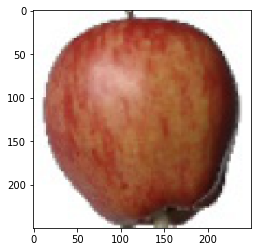

APPLE


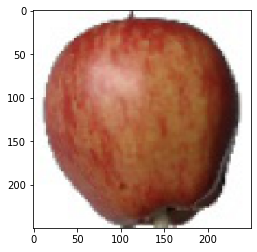

APPLE


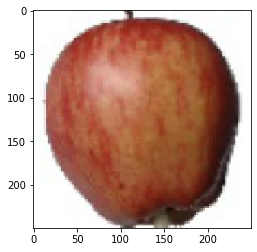

APPLE


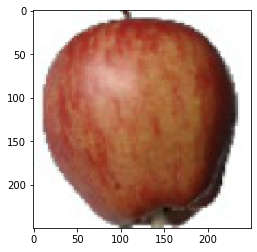

APPLE


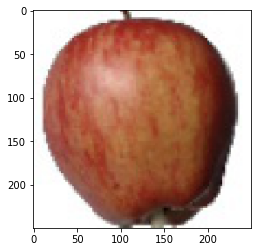

APPLE


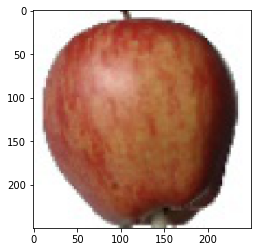

APPLE


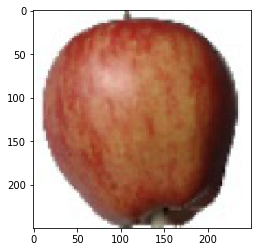

APPLE


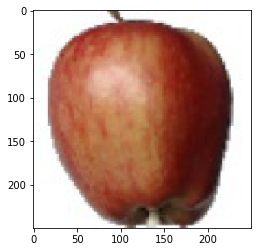

APPLE


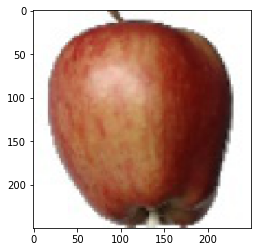

APPLE


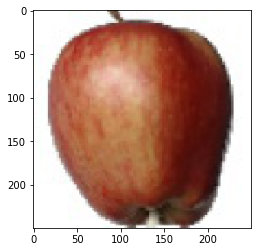

APPLE


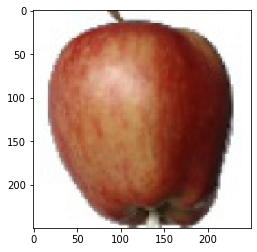

APPLE


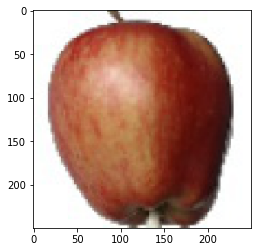

APPLE


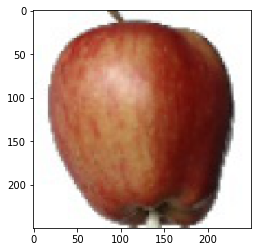

APPLE


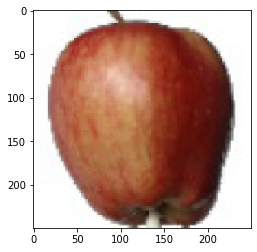

APPLE


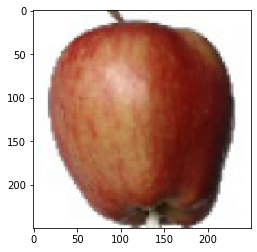

APPLE


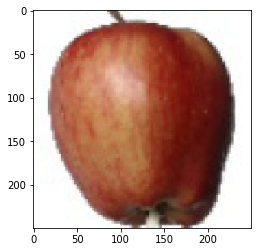

APPLE


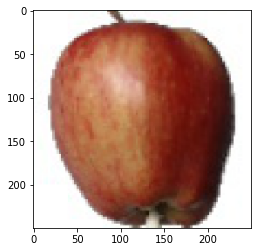

APPLE


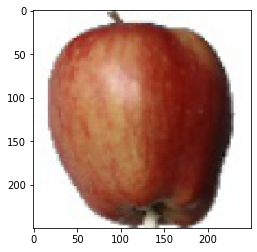

APPLE


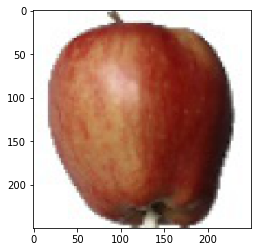

APPLE


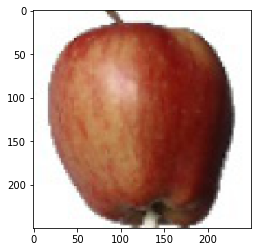

APPLE


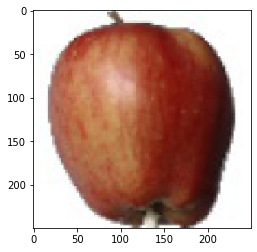

APPLE


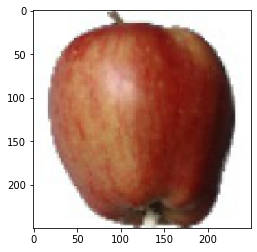

APPLE


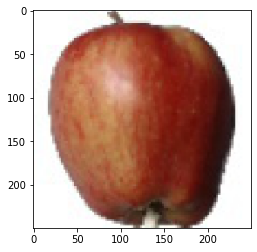

APPLE


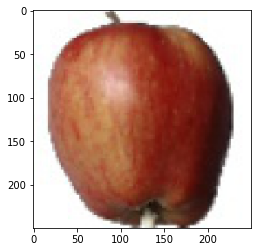

APPLE


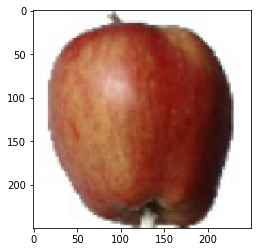

APPLE


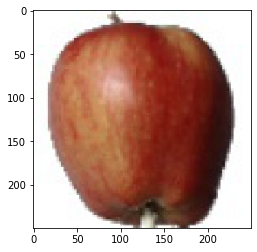

APPLE


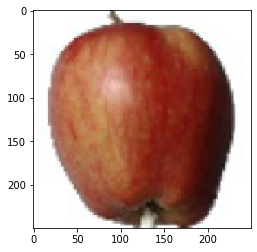

APPLE


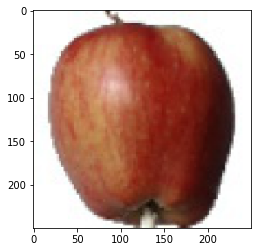

APPLE


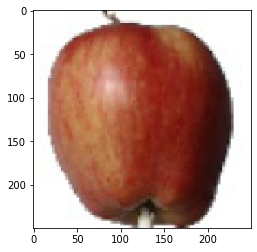

APPLE


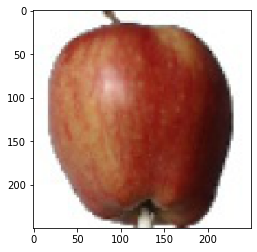

APPLE


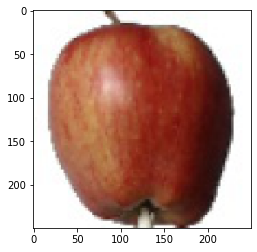

APPLE


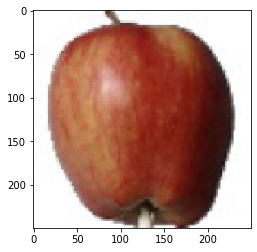

APPLE


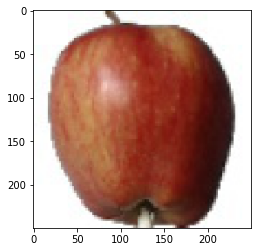

APPLE


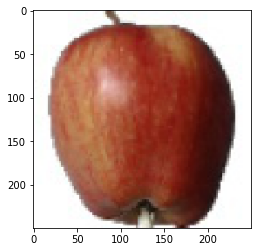

APPLE


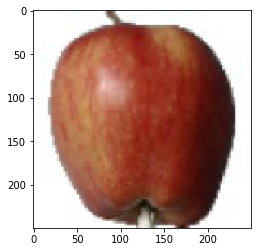

APPLE


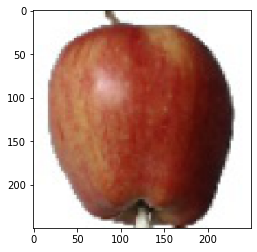

APPLE


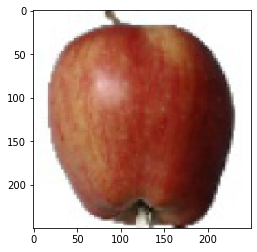

APPLE


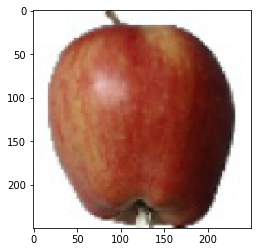

APPLE


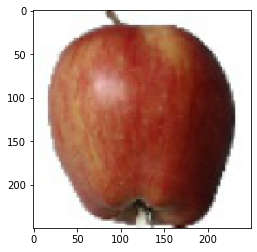

APPLE


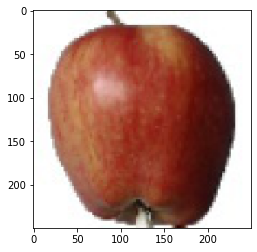

APPLE


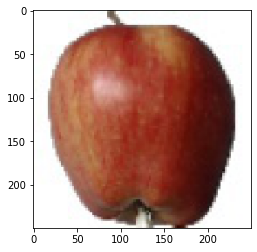

APPLE


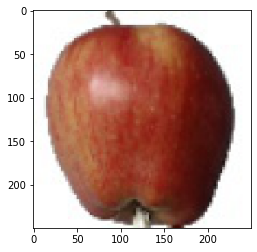

APPLE


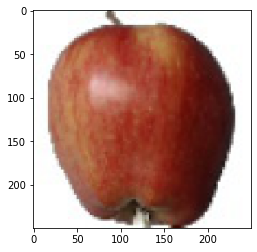

APPLE


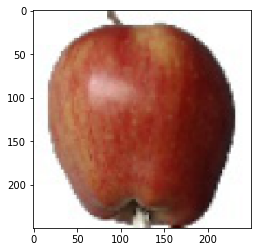

APPLE


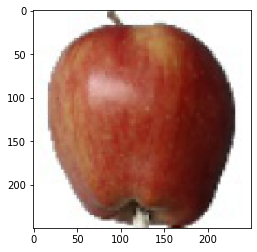

APPLE


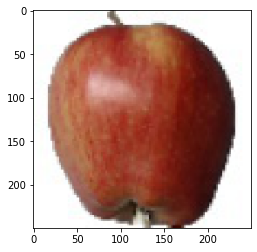

APPLE


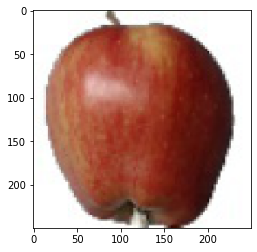

APPLE


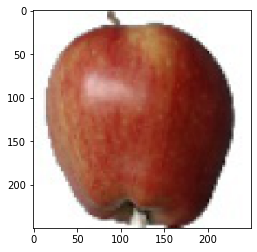

APPLE


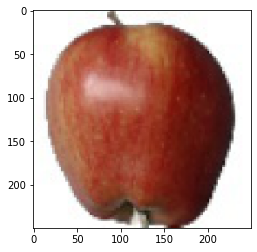

APPLE


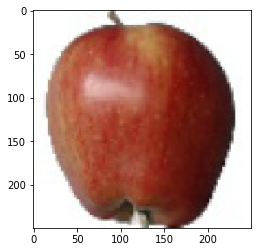

APPLE


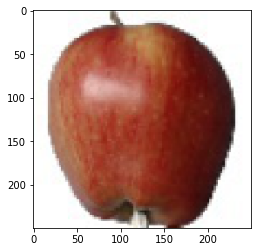

APPLE


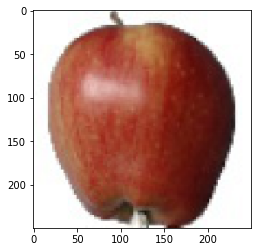

APPLE


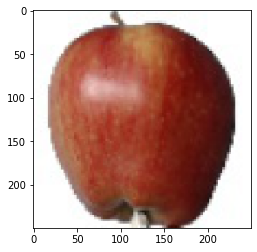

APPLE


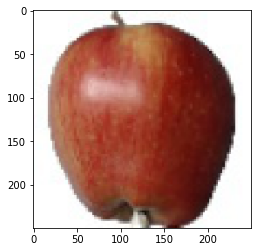

APPLE


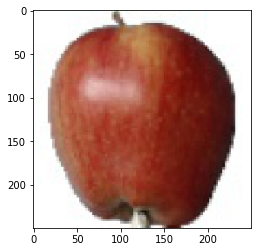

APPLE


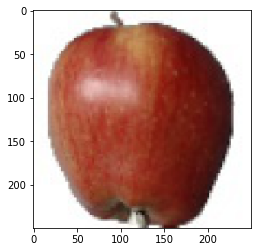

APPLE


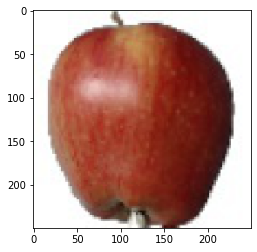

APPLE


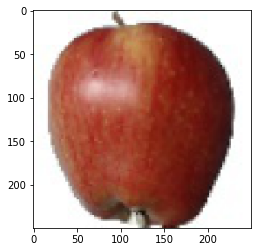

APPLE


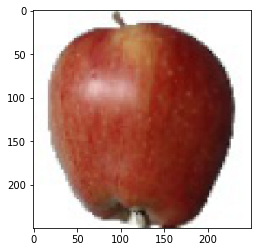

APPLE


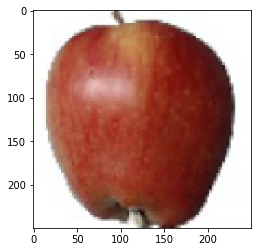

APPLE


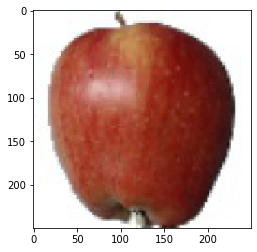

APPLE


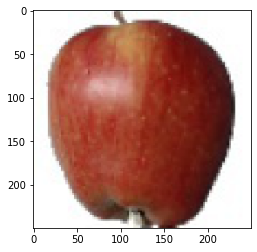

APPLE


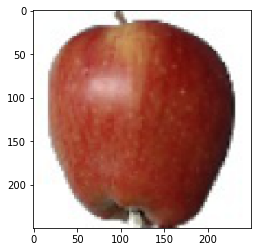

APPLE


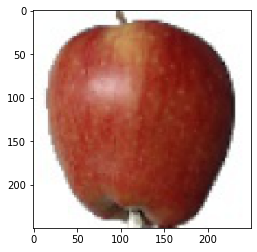

APPLE


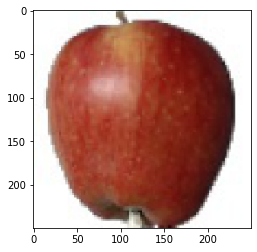

APPLE


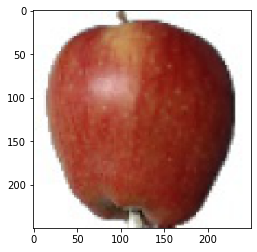

APPLE


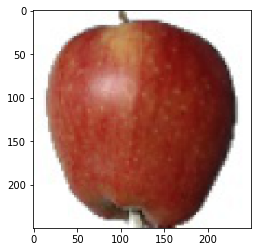

APPLE


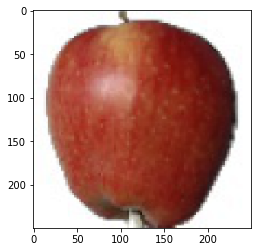

APPLE


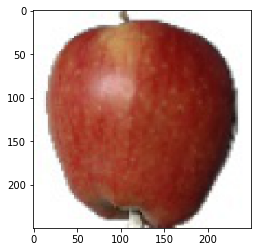

APPLE


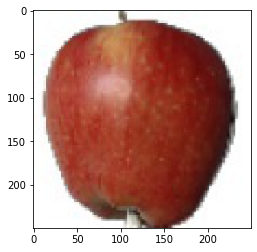

APPLE


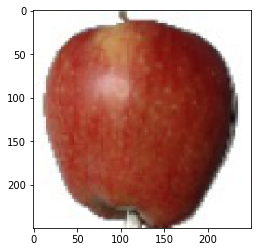

APPLE


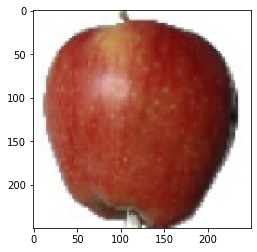

APPLE


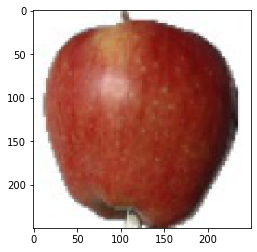

APPLE


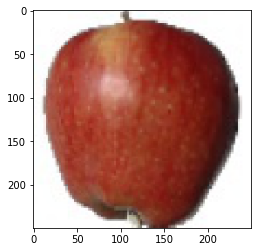

APPLE


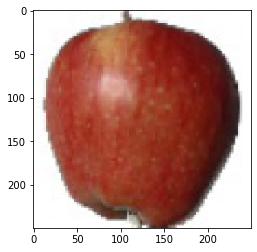

APPLE


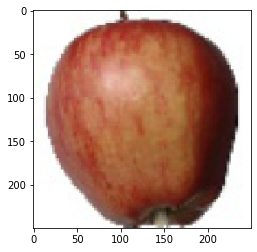

APPLE


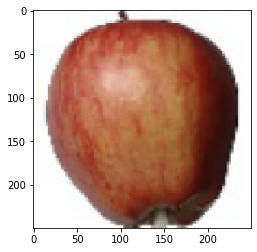

APPLE


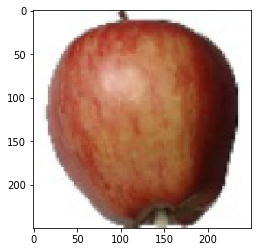

APPLE


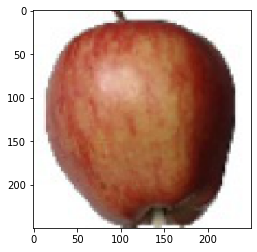

APPLE


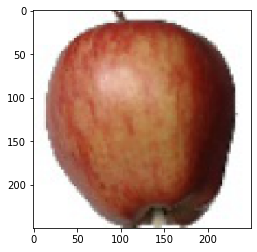

APPLE


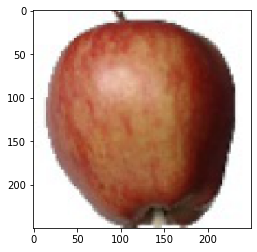

APPLE


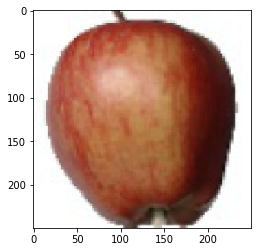

APPLE


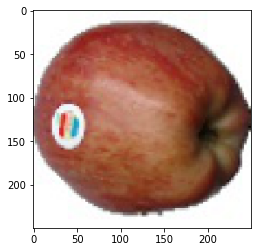

APPLE


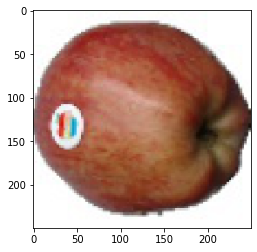

APPLE


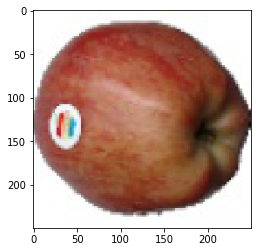

APPLE


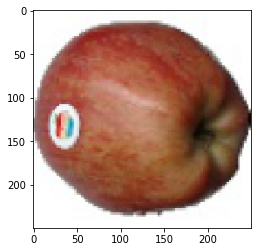

APPLE


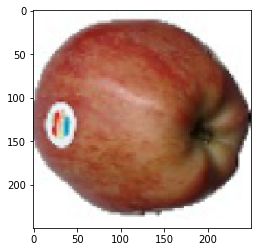

APPLE


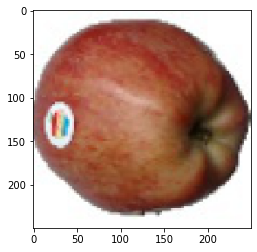

APPLE


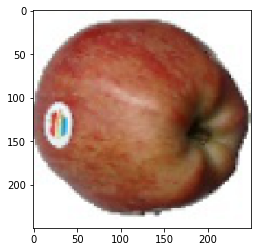

APPLE


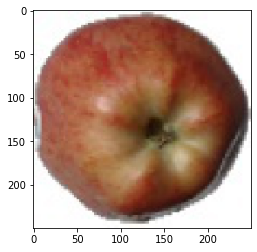

APPLE


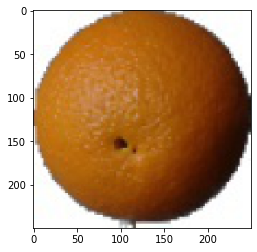

ORANGE


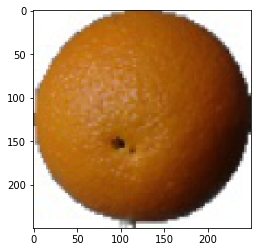

ORANGE


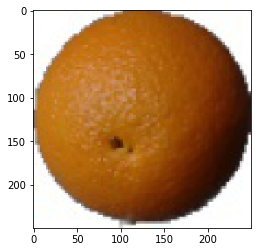

ORANGE


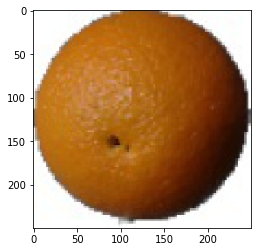

ORANGE


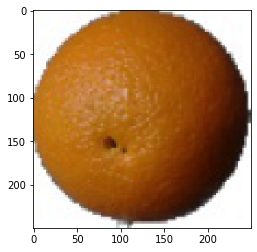

ORANGE


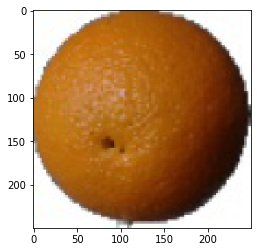

ORANGE


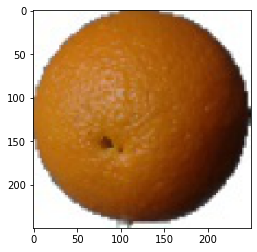

ORANGE


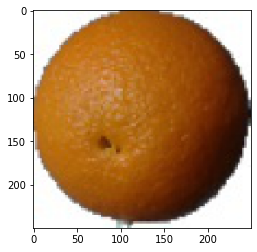

ORANGE


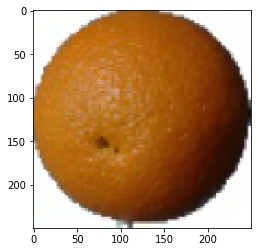

ORANGE


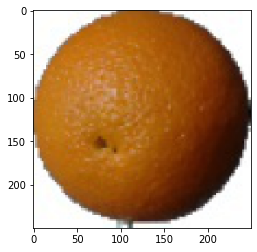

ORANGE


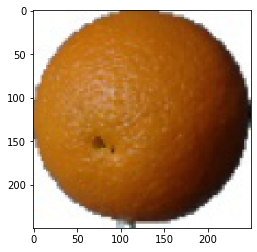

ORANGE


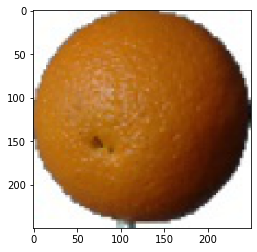

ORANGE


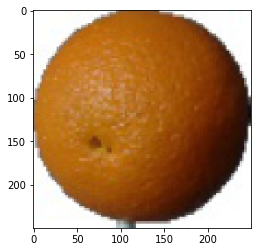

ORANGE


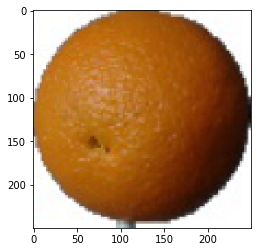

ORANGE


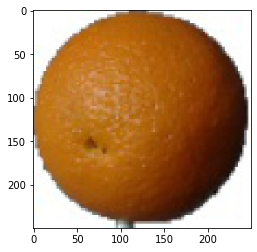

ORANGE


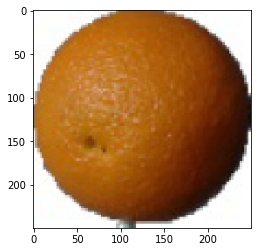

ORANGE


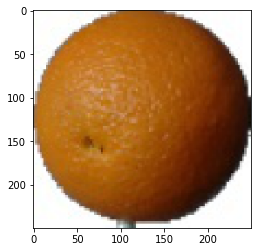

ORANGE


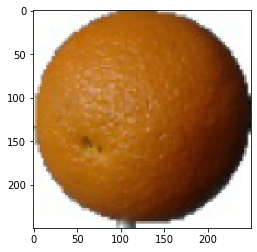

ORANGE


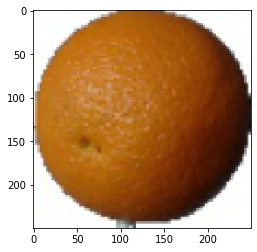

ORANGE


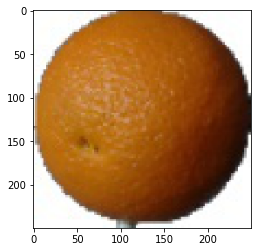

ORANGE


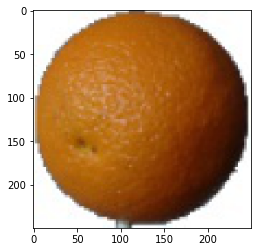

ORANGE


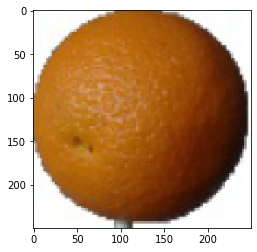

ORANGE


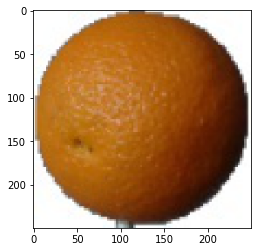

ORANGE


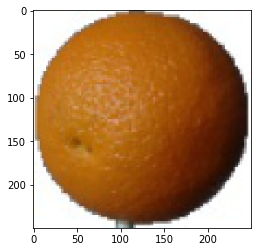

ORANGE


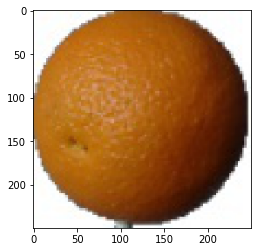

ORANGE


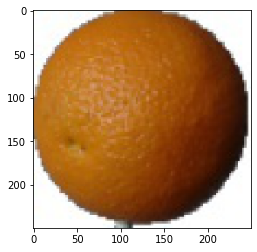

ORANGE


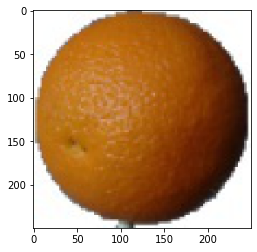

ORANGE


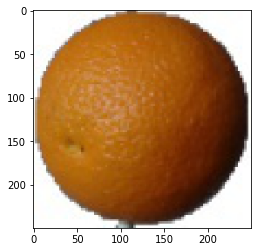

ORANGE


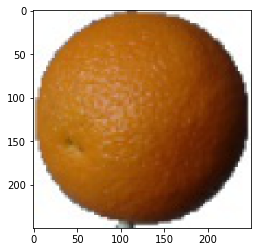

ORANGE


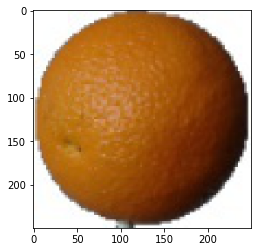

ORANGE


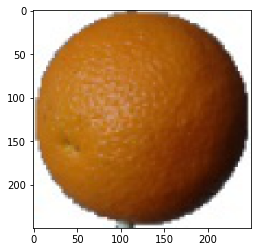

ORANGE


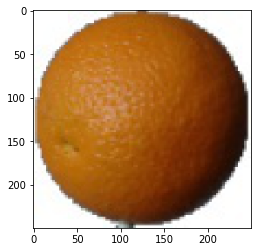

ORANGE


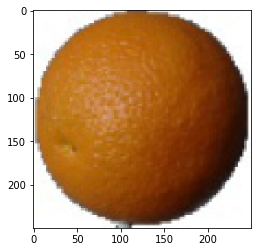

ORANGE


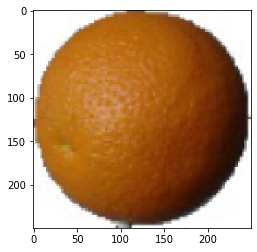

ORANGE


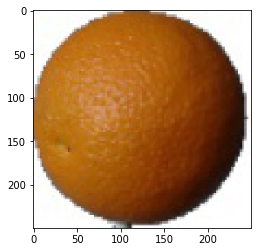

ORANGE


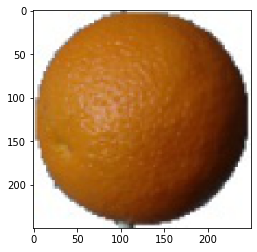

ORANGE


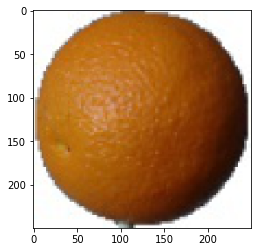

ORANGE


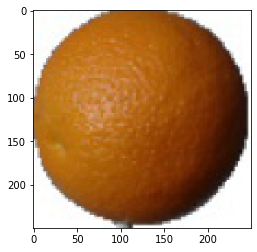

ORANGE


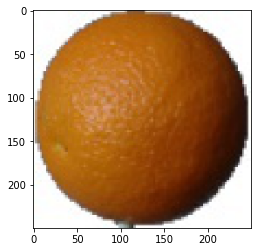

ORANGE


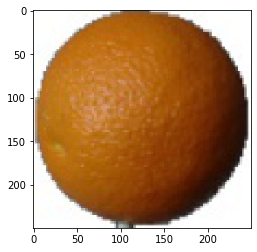

ORANGE


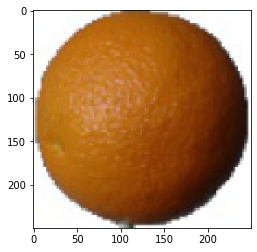

ORANGE


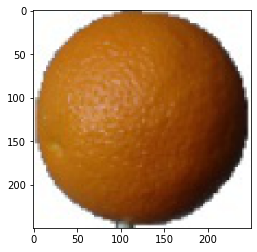

ORANGE


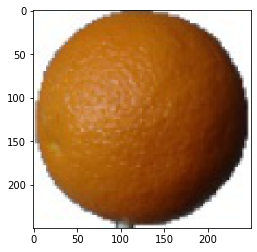

ORANGE


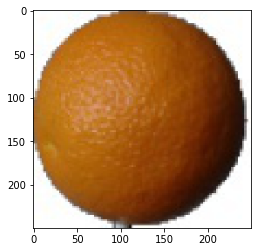

ORANGE


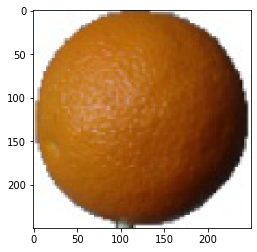

ORANGE


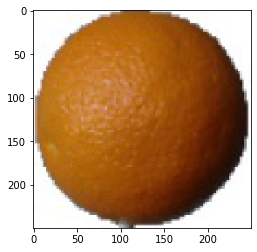

ORANGE


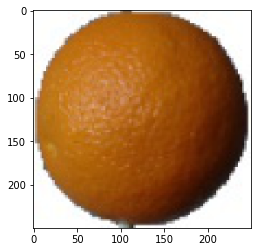

ORANGE


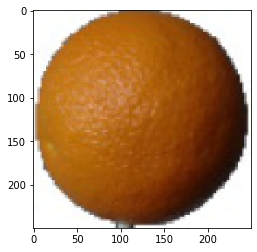

ORANGE


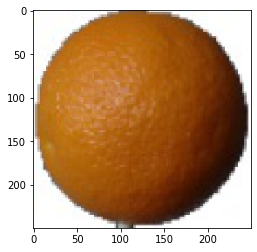

ORANGE


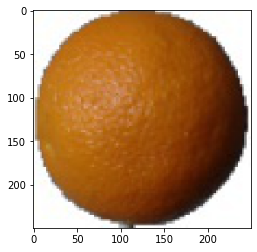

ORANGE


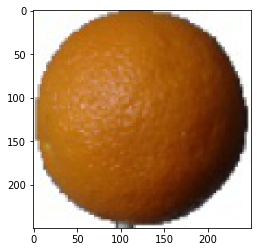

ORANGE


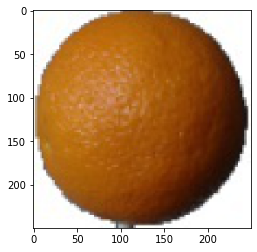

ORANGE


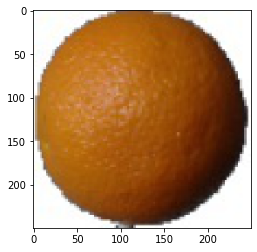

ORANGE


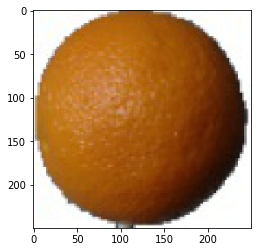

ORANGE


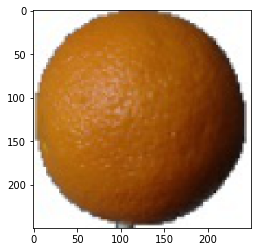

ORANGE


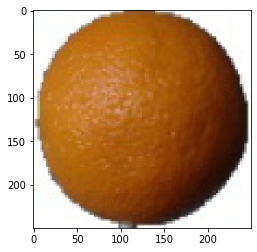

ORANGE


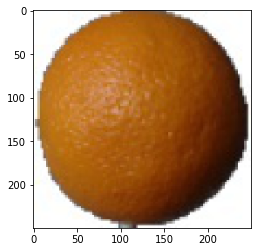

ORANGE


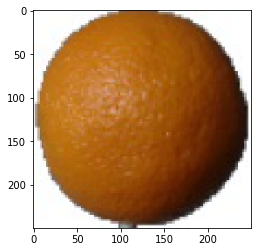

ORANGE


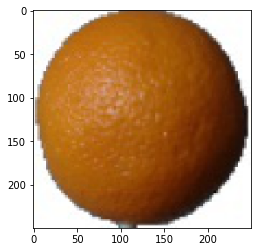

ORANGE


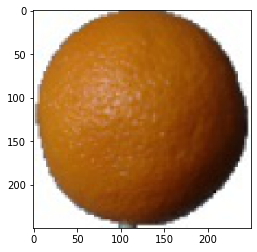

ORANGE


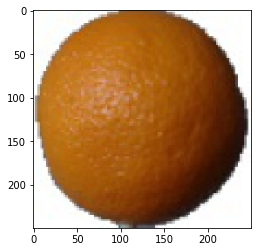

ORANGE


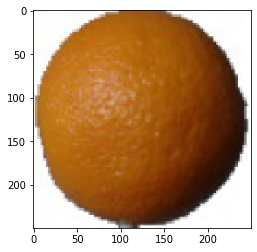

ORANGE


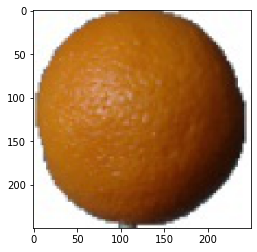

ORANGE


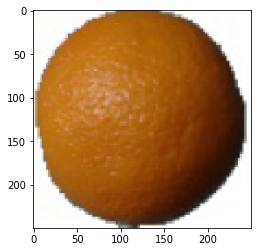

ORANGE


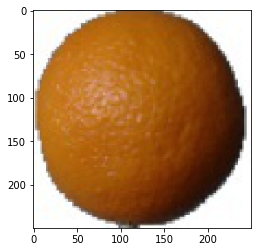

ORANGE


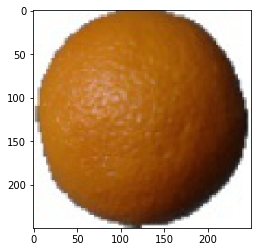

ORANGE


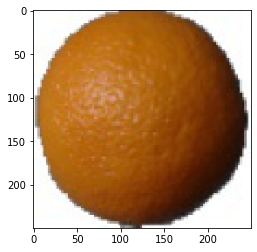

ORANGE


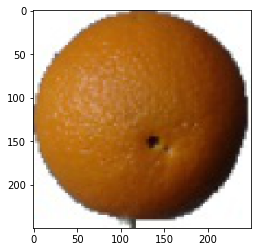

ORANGE


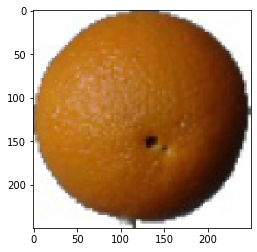

ORANGE


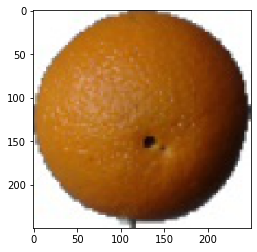

ORANGE


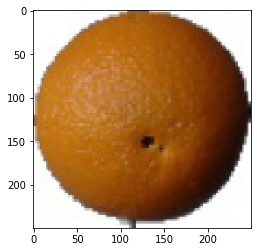

ORANGE


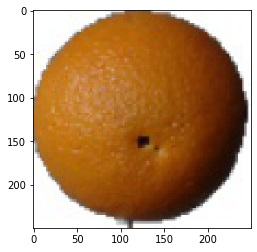

ORANGE


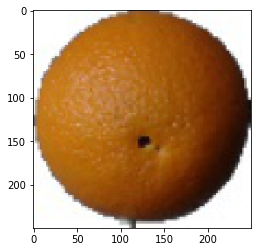

ORANGE


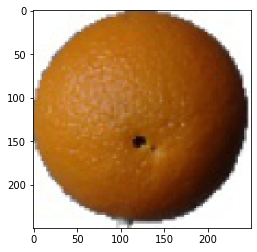

ORANGE


In [36]:
dir_path = 'Test'
for i in os.listdir(dir_path):
    #img = image.load_img(dir_path + '//'+ i, target_size=(250,250)) # For Windows
    img = image.load_img(dir_path + '/'+ i, target_size=(250,250)) #Linux/Mac
    plt.imshow(img)
    plt.show()

    X = image.img_to_array(img)
    X = np.expand_dims(X, axis=0)
    im = np.vstack([X])
    val = model.predict(im)
    if val == 0:
        print("APPLE")
    else:
        print("ORANGE")